# Neural Style Transfer in Pytorch

This notebook is based on the tutorial: https://pytorch.org/tutorials/advanced/neural_style_tutorial.html

"Neural-Style, or Neural-Transfer, allows you to take an image and reproduce it with a new artistic style. The algorithm takes three images, an input image, a content-image, and a style-image, and changes the input to resemble the content of the content-image and the artistic style of the style-image."



The principle is simple: we define two distances, one for the content (Dc) and one for the style (Ds). 
Dc measures how different the content is between two images while Ds measures how different the style is between two images. 
Then, we take a third image, the input, and transform it to minimize both its content-distance with the content-image and its style-distance with the style-image. Now we can import the necessary packages and begin the neural transfer.

In [2]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

Set the style image and a content image paths:

In [4]:
content_path = 'sphynx_cat.jpg'
style_path = 'adele_block_from_klimt.jpg'

## Load images

The original PIL images have values between 0 and 255, but when transformed into torch tensors, their values are converted to be between 0 and 1. The images also need to be resized to have the same dimensions. An important detail to note is that neural networks from the torch library are trained with tensor values ranging from 0 to 1.

In [5]:
imsize = 512 # if torch.cuda.is_available() else 128  # use small size if no gpu

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor(), # transform it into a torch tensor
])  


def image_loader(image_name):
    image = Image.open(image_name)
    # Fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img = image_loader(style_path)
content_img = image_loader(content_path)

# assert style_img.size() == content_img.size(), \
#     "we need to import style and content images of the same size"

[2023-03-21 11:54:08.088 1-8-1-cpu-py36-ml-m5-large-986cd153b0d915a6191b6abb6eba:1759 INFO utils.py:27] RULE_JOB_STOP_SIGNAL_FILENAME: None
[2023-03-21 11:54:08.312 1-8-1-cpu-py36-ml-m5-large-986cd153b0d915a6191b6abb6eba:1759 INFO profiler_config_parser.py:102] Unable to find config at /opt/ml/input/config/profilerconfig.json. Profiler is disabled.


In [6]:
style_img.shape

torch.Size([1, 3, 668, 512])

In [7]:
content_img.shape

torch.Size([1, 3, 570, 512])

#### Visualize images:

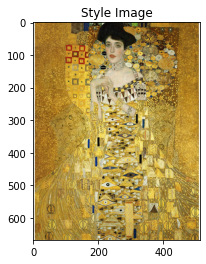

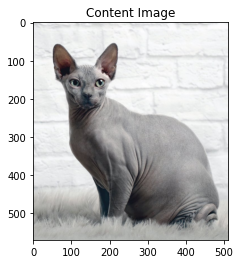

In [8]:
plt.ion() #  turn on interactive mode.

def imshow(tensor, title=None):
    unloader = transforms.ToPILImage()  # reconvert into PIL image
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

## Define Loss functions

#### Content Loss

In [9]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

#### Style Loss

In [10]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)


class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

## Importing the Model

In [11]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

In [12]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

In [13]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

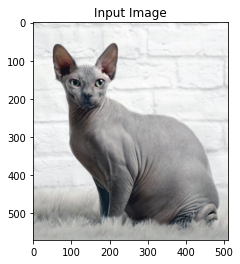

In [14]:
input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

## Gradient Descent

In [15]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

In [16]:
style_weight=1e7 #1e5 (saved images)  1e7
content_weight=1e1

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=style_weight, content_weight=content_weight):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

In [17]:
style_img.shape

torch.Size([1, 3, 668, 512])

In [18]:
content_img.shape

torch.Size([1, 3, 570, 512])

In [19]:
target_shape = content_img.shape[2:]
transforms.Resize(target_shape)(style_img).shape

torch.Size([1, 3, 570, 512])

Building the style transfer model..


/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


Optimizing..
run [50]:
Style Loss : 2310.864746 Content Loss: 386.456665

run [100]:
Style Loss : 278.894775 Content Loss: 377.253418

run [150]:
Style Loss : 104.502304 Content Loss: 354.417908

run [200]:
Style Loss : 57.801754 Content Loss: 326.315338

run [250]:
Style Loss : 41.334179 Content Loss: 301.238251

run [300]:
Style Loss : 32.480408 Content Loss: 281.813599



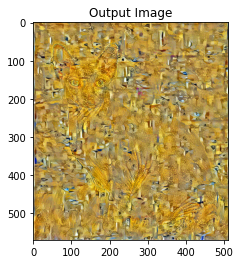

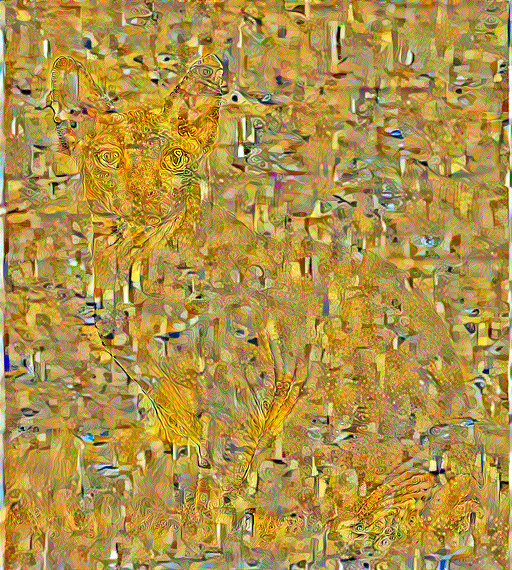

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 25.941372 Content Loss: 267.368225

run [100]:
Style Loss : 23.154718 Content Loss: 256.971924

run [150]:
Style Loss : 20.129442 Content Loss: 247.011581

run [200]:
Style Loss : 17.894938 Content Loss: 239.719879

run [250]:
Style Loss : 16.209049 Content Loss: 232.546814

run [300]:
Style Loss : 15.281633 Content Loss: 226.815887



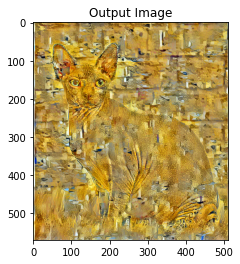

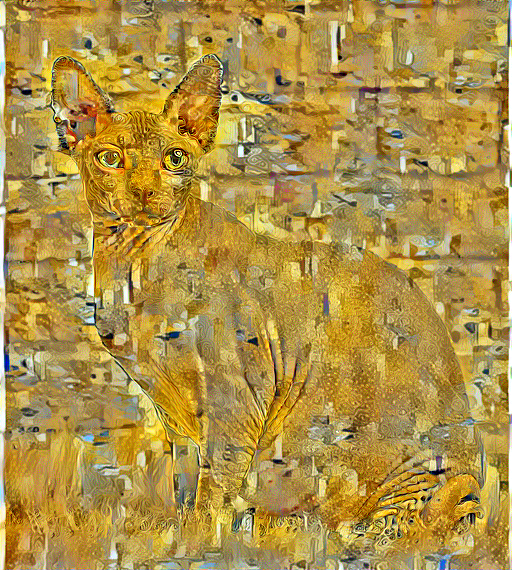

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 12.593298 Content Loss: 222.970154

run [100]:
Style Loss : 11.934972 Content Loss: 219.834076

run [150]:
Style Loss : 11.483780 Content Loss: 217.032913

run [200]:
Style Loss : 10.623225 Content Loss: 214.700851

run [250]:
Style Loss : 9.767785 Content Loss: 212.574951

run [300]:
Style Loss : 10.066392 Content Loss: 209.936890



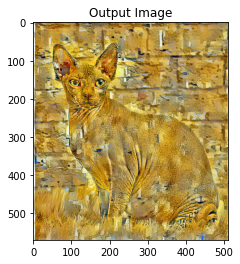

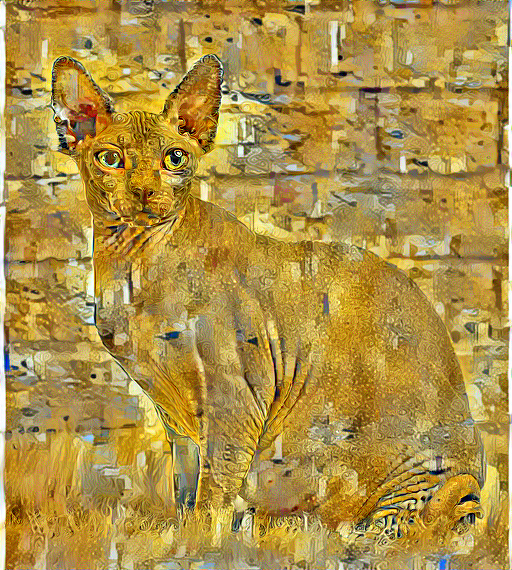

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 8.391167 Content Loss: 207.957214

run [100]:
Style Loss : 8.373809 Content Loss: 206.379471

run [150]:
Style Loss : 8.040483 Content Loss: 205.335205

run [200]:
Style Loss : 8.179852 Content Loss: 205.705200

run [250]:
Style Loss : 7.411618 Content Loss: 203.097168

run [300]:
Style Loss : 7.236699 Content Loss: 202.006470



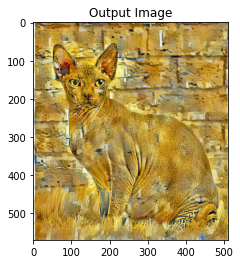

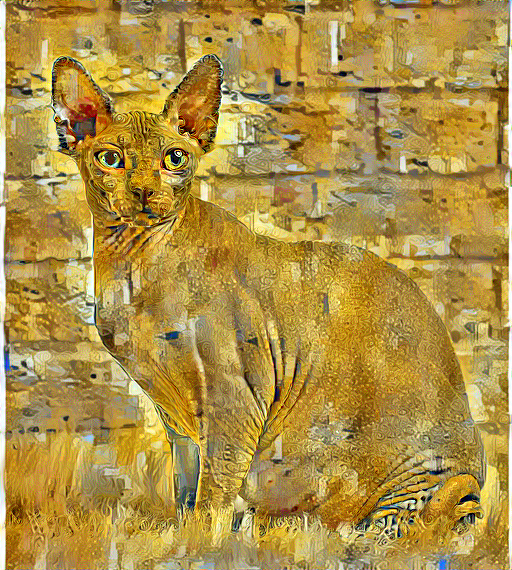

In [20]:
import torchvision.transforms.functional as TF
target_shape = content_img.shape[2:]
style_img_reshaped = transforms.Resize(target_shape)(style_img)


for i in range(4):
    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                content_img, style_img_reshaped, input_img)

    plt.figure()
    imshow(output, title='Output Image')
    result_img = TF.to_pil_image(output.cpu()[0])
    result_img.save(f'img-pytorch-iter-1e7style-{i}.jpg')
    display(result_img)

    plt.ioff()
    plt.show()

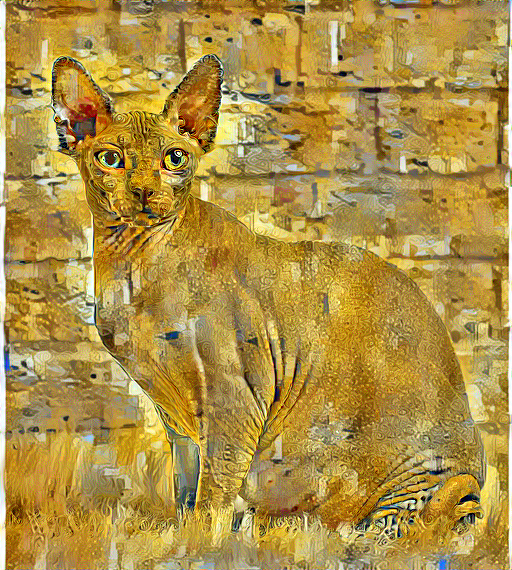

In [21]:
import torchvision.transforms.functional as TF

TF.to_pil_image(output.cpu()[0])

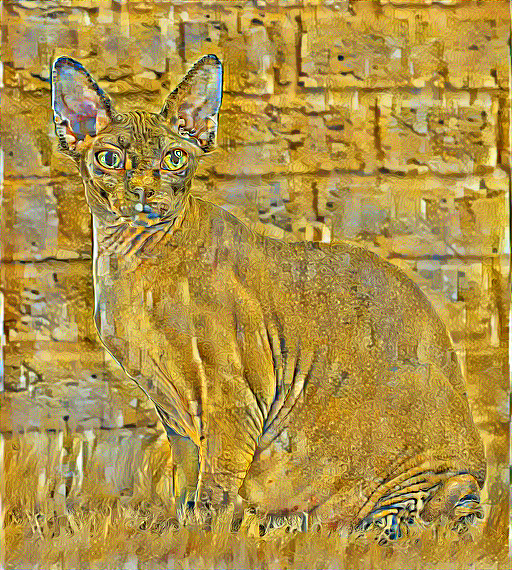

In [22]:
import torchvision.transforms.functional as TF
# Iterations of 100 and restarts...
TF.to_pil_image(output.cpu()[0])

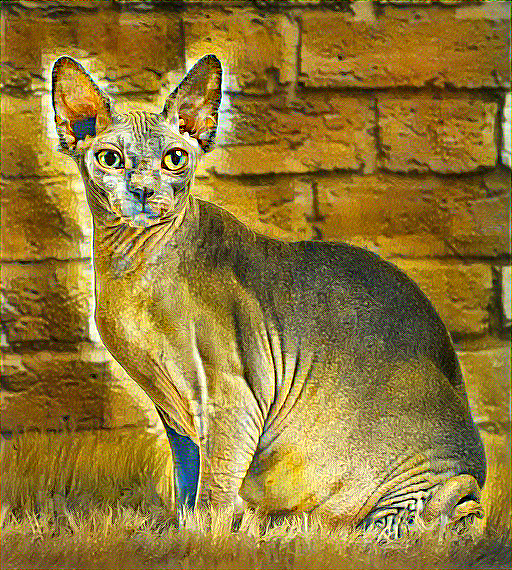

In [25]:
import torchvision.transforms.functional as TF
#1e5
TF.to_pil_image(output.cpu()[0])

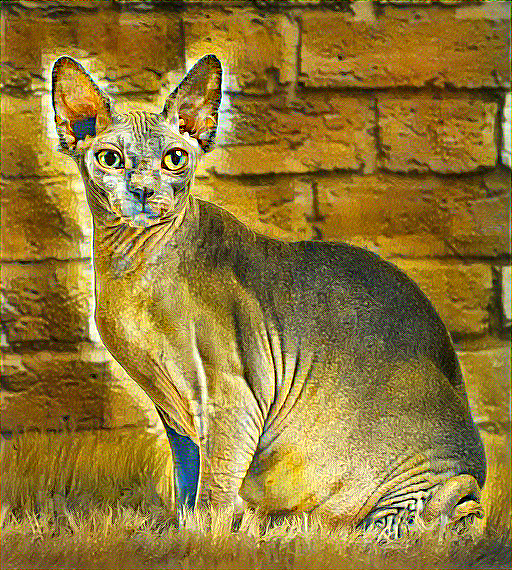

In [23]:
import torchvision.transforms.functional as TF

TF.to_pil_image(output.cpu()[0])

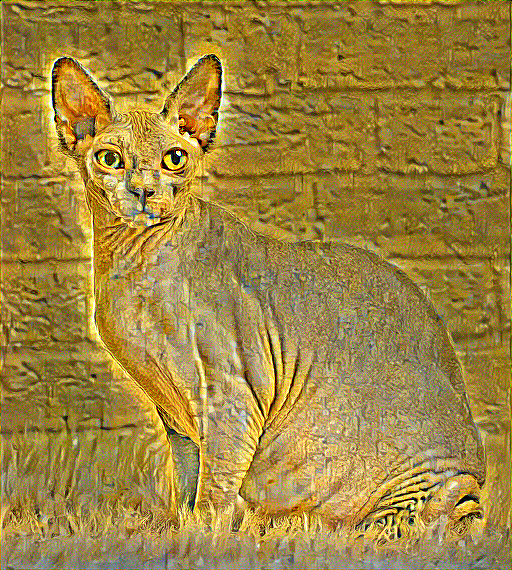

In [21]:
import torchvision.transforms.functional as TF

TF.to_pil_image(output.cpu()[0])

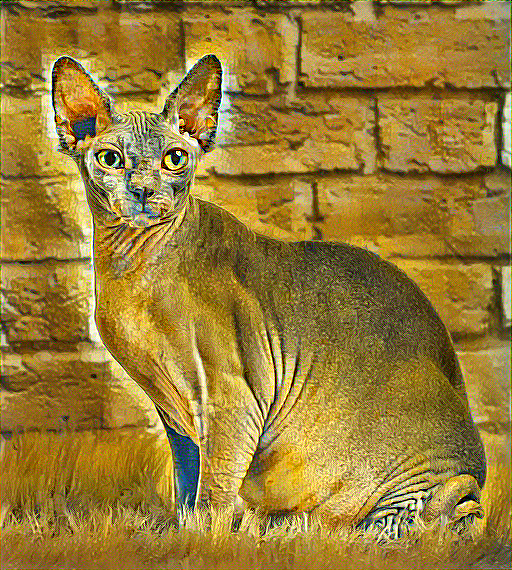

In [22]:
import torchvision.transforms.functional as TF

# 300 steps

TF.to_pil_image(output.cpu()[0])